# Assignment 6 

This assignment will look at three datasets (School location, Traffic camera, and speed limit map) from the city of Calgary. We are trying to proportion of camera installed around school area, and how speed limit designed around school area, and anywhere cameras are installed.

- School Locations: https://data.calgary.ca/Services-and-Amenities/School-Locations/fd9t-tdn2

- Traffic Camera: https://data.calgary.ca/Transportation-Transit/Traffic-Cameras/k7p9-kppz/explore

- Speed Limit Map: https://data.calgary.ca/Health-and-Safety/Speed-Limits-Map/rbfp-3tic

In [2]:
import pandas as pd
import geopandas as gp
import plotly.express as px
import plotly.graph_objects as go

In [3]:
speed = pd.read_csv("https://raw.githubusercontent.com/serenasun999/dash624/master/dataset/Speed_Limits.csv")
cameras = pd.read_csv("https://raw.githubusercontent.com/serenasun999/dash624/master/dataset/Traffic_Cameras.csv")
school = pd.read_csv("https://raw.githubusercontent.com/serenasun999/dash624/master/dataset/School_Locations.csv")

school_gpd = gp.GeoDataFrame(school)
cameras_gpd = gp.GeoDataFrame(cameras)
speed_gpd = gp.GeoDataFrame(speed)

In [4]:
school_gpd

,NAME,BOARD,EMAIL,ADDRESS,CITY,PROVINCE,POSTAL_COD,PHONE_NO,FAX_NO,GRADES,POSTSECOND,DATA_SOURCE,ELEM,JUNIOR_H,SENIOR_H,the_geom
0,Alberta Chung Wah School,Alberta Chung Wah School Society,office@albertachungwahschool.ca,328 CENTRE ST SE,Calgary,AB,T2G4X6,(403) 271-8033,NaN,Senior High,N,N,N,N,Y,POINT (-114.0617383 51.049565)
1,Holy Family School,The Calgary Roman Catholic Separate School Div...,holy.family@cssd.ab.ca,904 32 ST SE,Calgary,AB,T2A0Z1,(403) 500-2054,NaN,Elementary,N,N,Y,N,N,POINT (-113.9878638 51.0455362)
2,Ethel M. Johnson School,The Calgary School Division,ethelmjohnson@cbe.ab.ca,255 SACKVILLE DR SW,Calgary,AB,T2W0W7,(403) 777-8500,NaN,Elementary,N,N,Y,N,N,POINT (-114.0890389 50.9554734)
3,Cranston School,The Calgary School Division,cranston@cbe.ab.ca,205 CRANSTON DR SE,Calgary,AB,T3M1E8,(403) 777-6267,NaN,Elementary,N,N,Y,N,N,POINT (-113.9872418 50.8867871)
4,St. Joseph Elementary Junior High School,The Calgary Roman Catholic Separate School Div...,stjoseph@cssd.ab.ca,2512 5 ST NW,Calgary,AB,T2M3C7,(403) 500-2009,NaN,Elementary/Junior High,N,N,Y,Y,N,POINT (-114.0733169 51.0747866)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
474,Rundle School,The Calgary School Division,rundle@cbe.ab.ca,4120 RUNDLEHORN DR NE,Calgary,AB,T1Y4W9,(403) 777-6760,NaN,Elementary,N,N,Y,N,N,POINT (-113.9737217 51.0711823)
475,The Third Academy,Third Academy International Ltd.,abed@thirdschools.ca,510 77 AV SE,Calgary,AB,T2H1C3,(403) 288-5335,NaN,Elementary,N,N,Y,N,N,POINT (-114.0514595 50.9851221)
476,St. Brigid,The Calgary Roman Catholic Separate School Div...,stbrigid@cssd.ab.ca,730 CITADEL WY NW,Calgary,AB,T3G5S6,(403) 500-2113,NaN,Elementary/Junior High,N,N,Y,Y,N,POINT (-114.1877229 51.1463403)
477,Dr. Gladys McKelvie Egbert School,The Calgary School Division,drgladysmegbert@cbe.ab.ca,6033 MADIGAN DR NE,Calgary,AB,T2A5G9,(403) 777-7780,NaN,Elementary/Junior High,N,N,Y,Y,N,POINT (-113.9415291 51.0588922)


In [5]:
cameras_gpd

,Camera URL,Quadrant,Camera Location,Point,City Quadrants,Calgary Communities,Ward Boundaries 2013-2017,Ward Boundaries
0,Camera 30 (http://trafficcam.calgary.ca/loc29....,SE,114 Avenue / 52 Street SE,POINT (-113.958331 50.9504395),3,79,8,4
1,Camera 140 (http://trafficcam.calgary.ca/loc13...,SW,162 Avenue / James McKevitt Road SW,POINT (-114.0992225 50.9054342),1,39,6,5
2,Camera 90 (http://trafficcam.calgary.ca/loc89....,NW/NE,Samis Road / Centre Street North,POINT (-114.0624739 51.0549834),2,62,7,7
3,Camera 38 (https://trafficcam.calgary.ca/loc37...,NW,Crowchild Trail / Shaganappi Trail NW,POINT (-114.149379 51.0988494),2,38,4,7
4,Camera 126 (http://trafficcam.calgary.ca/loc12...,SW,Bow Trail / Sarcee Trail SW,POINT (-114.1639913 51.0527426),1,170,2,14
...,...,...,...,...,...,...,...,...
150,Camera 127 (http://trafficcam.calgary.ca/loc12...,NW,Crowchild Trail / Sarcee Trail NW,POINT (-114.1782042 51.1112551),2,245,10,3
151,Camera 101 (http://trafficcam.calgary.ca/loc10...,NW,Stoney Trail / Beddington Trail NW,POINT (-114.1149257 51.1565751),2,25,12,3
152,Camera 22 (http://trafficcam.calgary.ca/loc21....,SE,50 Avenue / 52 Street SE,POINT (-113.958422 51.0088802),3,209,11,12
153,Camera 15 (http://trafficcam.calgary.ca/loc14....,SE,17 Avenue / 28 Street SE,POINT (-113.9930839 51.0377477),3,15,11,12


In [78]:
speed_gpd

,BOUND,CREATED_DT,DISTANCE,SPEED,STREET_NAME,MODIFIED_ATTRIBUTE_DT,multiline
0,N/S,NaN,4.18,60,TWELVE MILE COULEE RD,2012/08/20,"MULTILINESTRING ((-114.25741 51.13687, -114.25..."
1,N,NaN,2.21,80,SHAGANAPPI TR,2012/07/16,"MULTILINESTRING ((-114.13040 51.12917, -114.13..."
2,S,NaN,0.11,60,14 ST,NaN,"MULTILINESTRING ((-114.09487 50.94951, -114.09..."
3,E,NaN,1.85,60,JOHN LAURIE BV,NaN,"MULTILINESTRING ((-114.17787 51.12418, -114.17..."
4,W,NaN,1.55,60,JOHN LAURIE BV,NaN,"MULTILINESTRING ((-114.18140 51.12380, -114.18..."
...,...,...,...,...,...,...,...
3472,E/W,NaN,3.34,60,BEARSPAW DAM RD,2023/02/14,"MULTILINESTRING ((-114.21603 51.10208, -114.21..."
3473,NaN,2023/02/14,NaN,50,NaN,2023/02/14,"MULTILINESTRING ((-114.21723 51.10417, -114.21..."
3474,E/W,2023/02/14,3.34,50,BEARSPAW DAM RD,2023/02/14,"MULTILINESTRING ((-114.21009 51.10192, -114.21..."
3475,NaN,2023/02/22,NaN,20,NaN,2023/02/22,"MULTILINESTRING ((-114.07223 51.05926, -114.07..."


In [121]:
school_gpd["Quadrant"] = school_gpd["ADDRESS"].str[-2:]
print(school_gpd["Quadrant"].unique())
cameras_gpd["Quadrant"].unique()
school = school_gpd.groupby(["Quadrant","GRADES"]).count().reset_index()
camera = cameras_gpd.groupby("Quadrant").count().reset_index()
camera

['SE' 'SW' 'NW' 'NE' nan]


,Quadrant,Camera URL,Camera Location,Point,City Quadrants,Calgary Communities,Ward Boundaries 2013-2017,Ward Boundaries
0,NE,29,29,29,29,29,29,29
1,NW,29,29,29,29,29,29,29
2,NW/NE,4,4,4,4,4,4,4
3,SE,48,48,48,48,48,48,48
4,SW,31,31,31,31,31,31,31
5,SW/SE,14,14,14,14,14,14,14


In [175]:
import plotly.graph_objs as go
from plotly.subplots import make_subplots

# create the subplot figure with two rows and one column
fig = make_subplots(rows=1, cols=2)

fig.add_trace(go.Bar(x=school["Quadrant"], y=school["NAME"], text=school["GRADES"],
                    base='overlay', name="Schools"),1,1)

fig.add_trace(go.Bar(x=camera["Quadrant"], y=camera["Point"], name="Cameras"),1,2)

fig.update_xaxes(title_text="Quadrant", row=1, col=1)
fig.update_yaxes(title_text="Number of Schools", row=1, col=1)
fig.update_xaxes(title_text="Quadrant", row=1, col=2)
fig.update_yaxes(title_text="Number of Cameras", row=1, col=2)

# update the layout to display the subplots side by side
fig.update_layout(title='Distribution of Schools and Cameras in Calgary')

# display the figure
fig.show()


In [153]:
import plotly.graph_objs as go
from plotly.subplots import make_subplots

# create the subplot figure with two rows and one column
fig = make_subplots(rows=1, cols=2)

# create the first line trace and add it to the first subplot
trace1 = px.bar(school, x="Quadrant", y="NAME", color = "GRADES",title='School')
fig.add_trace(trace1, row=1, col=1)

# create the second line trace and add it to the second subplot
trace2 = px.bar(camera, x="Quadrant", y="Point", title='Camera')
fig.add_trace(trace2, row=1, col=2)

# update the layout to display the subplots side by side
fig.update_layout(title='Side by Side bar Chart')

# display the figure
fig.show()


ValueError: 
    Invalid element(s) received for the 'data' property of 
        Invalid elements include: [Figure({
    'data': [{'alignmentgroup': 'True',
              'hovertemplate': 'Quadrant=%{x}<br>NAME=%{y}<extra></extra>',
              'legendgroup': '',
              'marker': {'color': '#636efa', 'pattern': {'shape': ''}},
              'name': '',
              'offsetgroup': '',
              'orientation': 'v',
              'showlegend': False,
              'textposition': 'auto',
              'type': 'bar',
              'x': array(['NE', 'NE', 'NE', 'NE', 'NE', 'NE', 'NE', 'NW', 'NW', 'NW', 'NW', 'NW',
                          'NW', 'NW', 'SE', 'SE', 'SE', 'SE', 'SE', 'SE', 'SE', 'SW', 'SW', 'SW',
                          'SW', 'SW', 'SW', 'SW'], dtype=object),
              'xaxis': 'x',
              'y': array([45, 23,  6,  2,  2,  8,  5, 65, 26, 11,  4,  5, 14,  6, 56, 29,  5,  4,
                           3, 10,  6, 57, 31, 19,  8,  5, 13,  7]),
              'yaxis': 'y'}],
    'layout': {'barmode': 'relative',
               'legend': {'tracegroupgap': 0},
               'template': '...',
               'title': {'text': 'School'},
               'xaxis': {'anchor': 'y', 'domain': [0.0, 1.0], 'title': {'text': 'Quadrant'}},
               'yaxis': {'anchor': 'x', 'domain': [0.0, 1.0], 'title': {'text': 'NAME'}}}
})]

    The 'data' property is a tuple of trace instances
    that may be specified as:
      - A list or tuple of trace instances
        (e.g. [Scatter(...), Bar(...)])
      - A single trace instance
        (e.g. Scatter(...), Bar(...), etc.)
      - A list or tuple of dicts of string/value properties where:
        - The 'type' property specifies the trace type
            One of: ['bar', 'barpolar', 'box', 'candlestick',
                     'carpet', 'choropleth', 'choroplethmapbox',
                     'cone', 'contour', 'contourcarpet',
                     'densitymapbox', 'funnel', 'funnelarea',
                     'heatmap', 'heatmapgl', 'histogram',
                     'histogram2d', 'histogram2dcontour', 'icicle',
                     'image', 'indicator', 'isosurface', 'mesh3d',
                     'ohlc', 'parcats', 'parcoords', 'pie',
                     'pointcloud', 'sankey', 'scatter',
                     'scatter3d', 'scattercarpet', 'scattergeo',
                     'scattergl', 'scattermapbox', 'scatterpolar',
                     'scatterpolargl', 'scattersmith',
                     'scatterternary', 'splom', 'streamtube',
                     'sunburst', 'surface', 'table', 'treemap',
                     'violin', 'volume', 'waterfall']

        - All remaining properties are passed to the constructor of
          the specified trace type

        (e.g. [{'type': 'scatter', ...}, {'type': 'bar, ...}])

In [134]:
px.bar(camera, x="Quadrant", y="Point", title='Camera')

###  1.All data cleaning and feature selection will be done here to avoid any data handling in the dash app. The dash app will only use to write out explaination contents and use cleaned data for ploting

<AxesSubplot:>

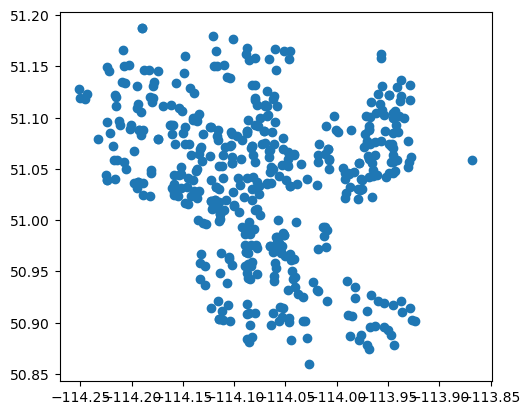

In [7]:
school_gpd['the_geom'] = gp.GeoSeries.from_wkt(school_gpd['the_geom']) # resign it to mention it is a geometry file
school_gpd = school_gpd.set_geometry('the_geom')
school_gpd.plot()

<AxesSubplot:>

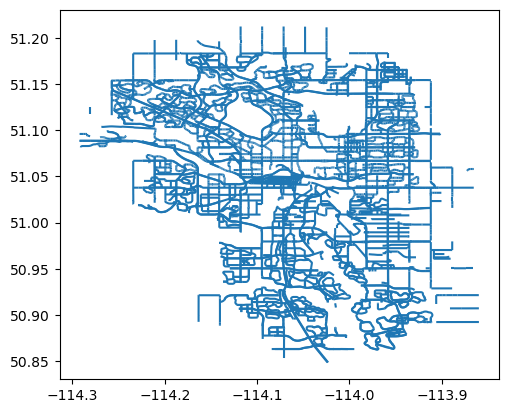

In [8]:
speed_gpd['multiline'] = gp.GeoSeries.from_wkt(speed_gpd['multiline']) # resign it to mention it is a geometry file
speed_gpd = speed_gpd.set_geometry('multiline')
speed_gpd.plot()

<AxesSubplot:>

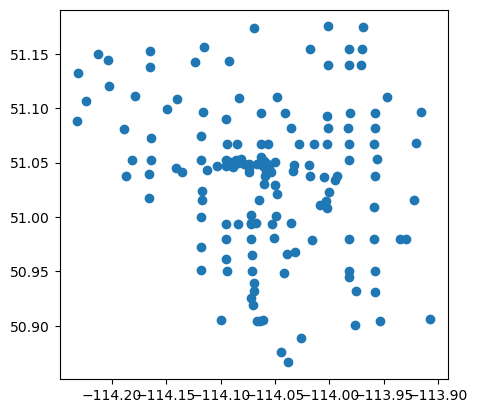

In [9]:
cameras_gpd['Point'] = gp.GeoSeries.from_wkt(cameras_gpd['Point']) # resign it to mention it is a geometry file
cameras_gpd = cameras_gpd.set_geometry('Point')
cameras_gpd.plot()

### 2. The first plot will be the distribution of cameras installed based on quadrant. Distribution of speed limit created based on the timeframe.

### 3. The second plot will be the map plot which contains the school location and camera location. Hopefully the map can add speed limit into it as well. If it is not working, then the third plot will be a map contains school location and the speed limit.

This line plot need some data handling or data transforming to handle multiplelinestring obejct. After line plot is done, add another trace - scatter plot (school location) on line plot. Also add scatter plot (cameras) on line plot if possible.


In [70]:
fig = px.scatter_mapbox(school_gpd,
                        lat=school_gpd.geometry.y,
                        lon=school_gpd.geometry.x,
                        hover_name="GRADES",
                        mapbox_style="carto-positron")
fig.show()

In [71]:
fig = px.scatter_mapbox(cameras_gpd,
                        lat=cameras_gpd.geometry.y,
                        lon=cameras_gpd.geometry.x,
                        hover_name="Quadrant",
                        mapbox_style="carto-positron")
fig.show()

In [101]:
import plotly.express as px
import geopandas as gpd
import shapely.geometry
import numpy as np
import wget

lats = []
lons = []
names = []
colors = []

for feature, name in zip(speed_gpd.geometry, speed_gpd.SPEED):
    if isinstance(feature, shapely.geometry.linestring.LineString):
        linestrings = [feature]
    elif isinstance(feature, shapely.geometry.multilinestring.MultiLineString):
        linestrings = feature.geoms
    else:
        continue
    for linestring in linestrings:
        x, y = linestring.xy
        lats = np.append(lats, y)
        lons = np.append(lons, x)
        # colors = np.append(colors, [np.random.rand(3)]*len(y))

        names = np.append(names, [name]*len(y))
        lats = np.append(lats, None)
        lons = np.append(lons, None)
        names = np.append(names, None)

In [93]:
len(names)
names

array([60.0, 60.0, 60.0, ..., 20, 20, None], dtype=object)

In [103]:
fig = px.line_mapbox(lat=lats, lon=lons, hover_name=names, color=lats,
                     mapbox_style="carto-positron", zoom=1)

fig.show()

KeyboardInterrupt: 

In [69]:
fig = px.line_mapbox(lat=lats, lon=lons, hover_name=names,
                     mapbox_style="carto-positron", zoom=1)

fig.add_trace(go.Scattermapbox(
                    lat=school_gpd.geometry.y,
                    lon=school_gpd.geometry.x,
                    mode='markers',
                    text=school_gpd.GRADES,
                    hoverinfo='text',
                    marker=dict(
                        color='plum',
                    ),
                    name='Schools'
                    ))

fig.add_trace(go.Scattermapbox(
                    lat=cameras_gpd.geometry.y,
                    lon=cameras_gpd.geometry.x,
                    mode='markers',
                    text=cameras_gpd.Quadrant,
                    hoverinfo='text',
                    name='Traffic Cameras'
                    ))

fig.update_layout(mapbox_zoom=10,
                  mapbox_center_lat=51.0486, mapbox_center_lon=-114.0708,
                  margin={"r":0,"t":0,"l":0,"b":0})

fig.show()